In [2]:
import xarray as xr
import numpy as np
import pandas as pd
import wradlib as wrl
import datetime as dt
import matplotlib.pyplot as plt
from pyart.graph import cm
import hvplot.xarray
import warnings
warnings.filterwarnings('ignore')
# import glob

In [4]:
ds1 = xr.open_dataset('merged_gridded/outfile_with_latlon.nc') # radar gridded data with lat/lon

In [82]:
ref = ds1.REF.sel(time=slice('2018-06-1','2018-06-10'))[:,5]

In [83]:
Z= wrl.trafo.idecibel(ref)

In [84]:
rain = wrl.zr.z_to_r(Z,a=200,b=1.6)

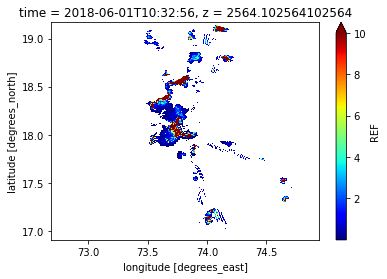

In [85]:
rain[50].plot.pcolormesh(cmap='jet',vmax=10)
# plt.grid()

In [87]:
ds2 = xr.open_dataset('GPM/merged_3mon.nc4') #GPM Data Final run
early = xr.open_dataset('GPM/earlyrun/merged_early.nc')#GPM Data Early run

In [89]:
gpm1 = ds2['precipitationCal'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8)).mean(dim=['lon','lat']).resample(time='1H').mean()
rain1 = rain.sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='1H').mean()

In [91]:
gpm1.shape,rain1.shape

((240,), (240,))

In [92]:
xtime = pd.date_range("2018-06-01T00:00 ","2018-06-10T23:00",freq="1H")

In [93]:
xtime.shape

(240,)

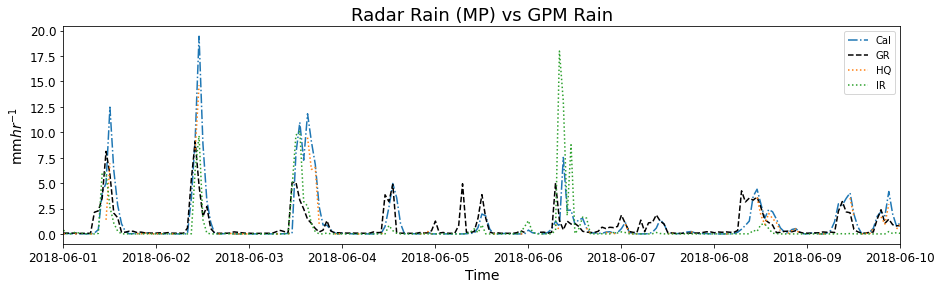

In [94]:
# plt.style.use('seaborn-white')
fig = plt.figure(figsize=[15,4])
plt.plot(xtime,ds2['precipitationCal'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='1H').mean(),'-.',label='Cal',)
plt.plot(xtime,rain.sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='1H').mean(),'k--',label='GR',)
plt.plot(xtime,ds2['HQprecipitation'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='1H').mean(),':',label='HQ',)
plt.plot(xtime,ds2['IRprecipitation'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='1H').mean(),':',label='IR',)
plt.ylabel('mm$hr^{-1}$',size=14)
plt.xlabel('Time',size=14)
plt.legend()
plt.title('Radar Rain (MP) vs GPM Rain',size=18)
plt.xlim(dt.datetime(2018,6,1),dt.datetime(2018,6,10))
plt.xticks(size=12)
plt.yticks(size=12)
# plt.grid()
plt.draw()

In [98]:
xr.corr(rain1,gpm1)

<xarray.DataArray ()>
array(0.58135458)
Coordinates:
    z        float64 2.564e+03

In [99]:
rain1.mean()-gpm1.mean()

<xarray.DataArray ()>
array(-0.18630027)
Coordinates:
    z        float64 2.564e+03

In [100]:
new_ds = xr.Dataset(
    {"Radar_Rain": (('time'), rain1.values),
    "GPM_Rain": (('time'),gpm1.values)},
    coords={
        "time":xtime
    },
)
new_ds['Radar_Rain'].attrs={'Long_Name':"X-Band Radar Rain",'Unit':'mm$hr^{-1}$'}
new_ds['GPM_Rain'].attrs={'Long_Name':"GPM Calibrated Rain",'Unit':'mm$hr^{-1}$'}
# new_ds.to_netcdf(fdir+'/new_data/grid_'+filename[-29:])

In [101]:
new_ds.hvplot.density()

:NdOverlay   [Variable]
   :Distribution   [value]   (Density)

In [102]:
new_ds.hvplot.hist(alpha=0.5)

:NdOverlay   [Element]
   :Histogram   [GPM_Rain]   (GPM_Rain_count)

In [103]:
new_ds.hvplot.scatter()

:NdOverlay   [Variable]
   :Scatter   [time]   (value)

In [104]:
new_ds.hvplot.area(alpha=0.5)

:NdOverlay   [Variable]
   :Area   [time]   (value,Baseline)

In [105]:
con = ref.where((ref>=35))
strat = ref.where(ref<35)

In [106]:
Z_con = wrl.trafo.idecibel(con)
Z_str = wrl.trafo.idecibel(strat)

In [107]:
c_rain = wrl.zr.z_to_r(Z_con,a=200,b=0.62)
s_rain = wrl.zr.z_to_r(Z_str,a=250,b=0.83)

In [108]:
s_rain.shape

(1115, 500, 500)

In [65]:
import panel as pn
import panel.widgets as pnw
import ipywidgets as ipw

In [66]:
slider = pnw.IntSlider(name='time', start=150, end=200)

ds1.REF.interactive(width=800).isel(time=slider)


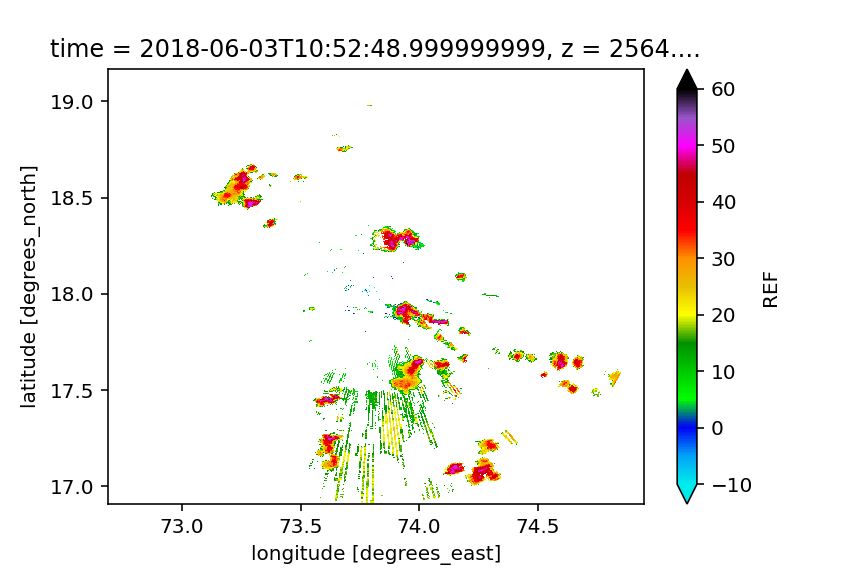

In [67]:
ds1.REF[280:350,5].interactive.sel(time=pnw.DiscreteSlider).plot(cmap='pyart_NWSRef',vmin=-10,vmax=60)


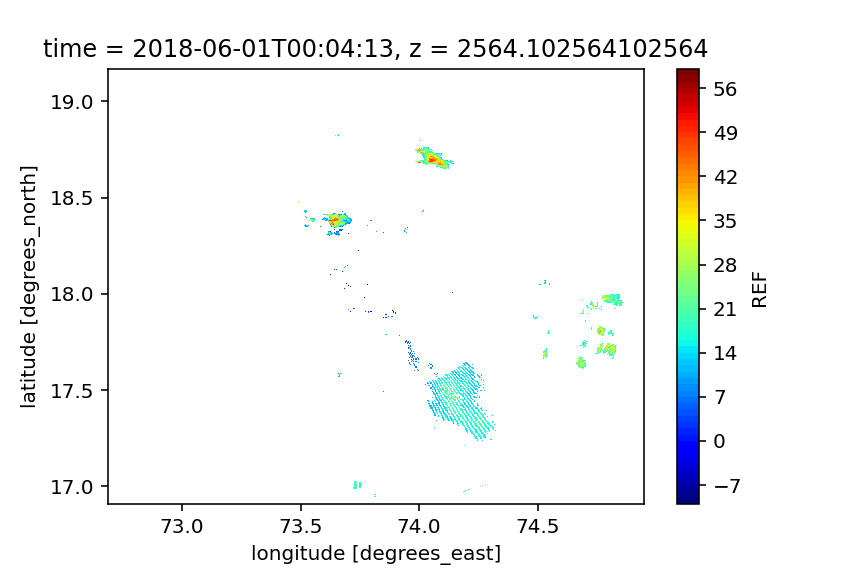

In [68]:
timex = pnw.Player(name='time', start=0, end=1000, loop_policy='loop', interval=100)
ds1.REF[:,5].interactive(loc='bottom').isel(time=timex).plot(cmap='jet',levels=np.arange(-10,60))

In [71]:
ds1.REF[160:250,5].hvplot.quadmesh(cmap='pyart_NWSRef',x='lon', y='lat', geo=False, widget_location='bottom', project=False)

Column
    [0] HoloViews(DynamicMap, widget_location='bottom')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2018-06-02 ...]), value=numpy.datetime64('2018-06-..., width=250)
        [2] HSpacer()

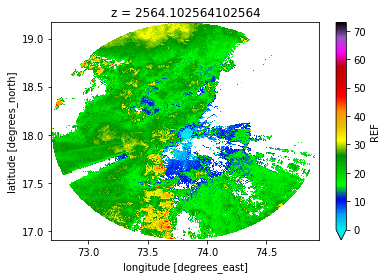

In [72]:
ds1['REF'].sel(time='2018-06-02')[:,5].mean(dim='time').plot(cmap='pyart_NWSRef',vmin=0)

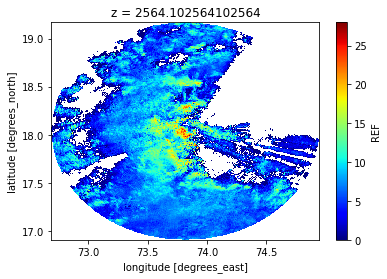

In [73]:
ds1['REF'].sel(time='2018-06-01')[:,5].std(dim='time').plot(cmap='jet',vmin=0)

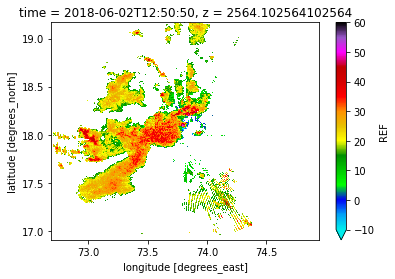

In [74]:
ds1['REF'].sel(time='2018-06-02')[60,5].plot(cmap='pyart_NWSRef',vmin=-10,vmax=60)

In [75]:
ds_trmm = xr.open_dataset('TRMM/merged_trmm.nc')

In [76]:
ds_trmm

<xarray.Dataset>
Dimensions:              (time: 89, lon: 17, lat: 21)
Coordinates:
  * time                 (time) datetime64[ns] 2018-06-01 ... 2018-06-12
  * lon                  (lon) float32 72.12 72.38 72.62 ... 75.62 75.88 76.12
  * lat                  (lat) float32 14.88 15.12 15.38 ... 19.38 19.62 19.88
Data variables:
    precipitation        (time, lat, lon) float32 ...
    precipitation_error  (time, lat, lon) float32 ...
    source               (time, lat, lon) int16 ...
    uncal_precipitation  (time, lat, lon) float32 ...
Attributes: (12/14)
    CDI:                 Climate Data Interface version 1.9.9 (https://mpimet...
    Conventions:         CF-1.6
    description:         Created from 3B42 RT 3-hourly binary file at GES DISC.
    title:               TRMM 3B42 RT 3-hourly, 0.25 deg.
    Note:                Data between 50.125 degrees N/S and 59.875 degrees N...
    ProductionTime:      2018-06-01 04:51:40.204885
    ...                  ...
    BeginDate:           2018-05-31
    EndTime:             01:30:00Z
    NominalTime:         2018-06-01T00:00:00Z
    BeginTime:           22:30:00Z
    history:             Tue Aug 17 03:18:35 2021: cdo mergetime grid_3B42RT....
    CDO:                 Climate Data Operators version 1.9.9 (https://mpimet...

In [77]:
time2 = pd.date_range("2018-06-01T00:00 ","2018-06-10T23:59",freq="3H")

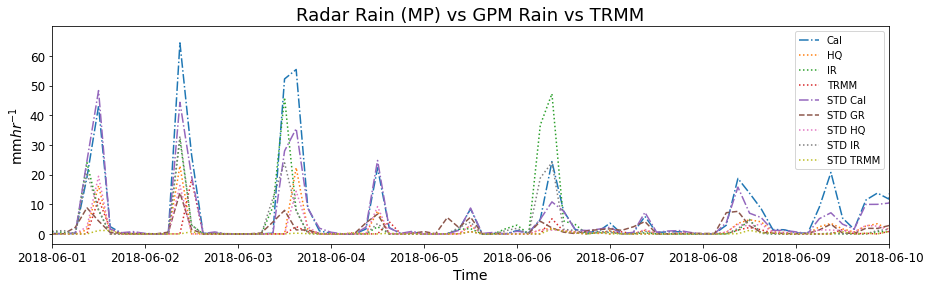

In [192]:
# plt.style.use('seaborn-white')
fig = plt.figure(figsize=[15,4])
plt.plot(time2,ds2['precipitationCal'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').sum(),'-.',label='Cal',)
# plt.plot(time2,rain.sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').mean(),'k--',label='GR',)
plt.plot(time2,ds2['HQprecipitation'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').sum(),':',label='HQ',)
plt.plot(time2,ds2['IRprecipitation'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').sum(),':',label='IR',)
plt.plot(time2,ds_trmm['precipitation'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').sum(),':',label='TRMM',)
# - - -  - -

plt.plot(time2,ds2['precipitationCal'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).std(dim=['lon','lat']).resample(time='3H').sum(),'-.',label='STD Cal',)
plt.plot(time2,rain.sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).std(dim=['lon','lat']).resample(time='3H').mean(),'--',label='STD GR',)
plt.plot(time2,ds2['HQprecipitation'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).std(dim=['lon','lat']).resample(time='3H').sum(),':',label='STD HQ',)
plt.plot(time2,ds2['IRprecipitation'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).std(dim=['lon','lat']).resample(time='3H').sum(),':',label='STD IR',)
plt.plot(time2,ds_trmm['precipitation'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).std(dim=['lon','lat']).resample(time='3H').sum(),':',label='STD TRMM',)

# - - - -  -

plt.ylabel('mm$hr^{-1}$',size=14)
plt.xlabel('Time',size=14)
plt.legend()
plt.title('Radar Rain (MP) vs GPM Rain vs TRMM',size=18)
plt.xlim(dt.datetime(2018,6,1),dt.datetime(2018,6,10))
plt.xticks(size=12)
plt.yticks(size=12)
# plt.grid()
plt.draw()

In [110]:
rr3 = rain.sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').sum()
g_cal3 = ds2['precipitationCal'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').sum()
trmm_3 = ds_trmm['precipitation'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').sum()

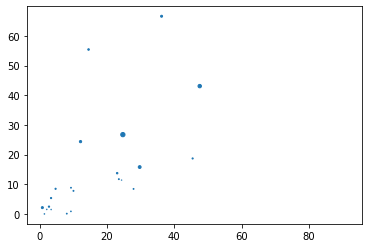

In [111]:
plt.scatter(rain.sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').sum(),
ds2['precipitationCal'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').sum(),
ds_trmm['precipitation'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').sum())

In [112]:
r3h = xr.Dataset(
    {"Radar_Rain": (('time'), rr3.values),
    "GPM_Rain": (('time'),g_cal3.values),
    "TRMM_Rain":(('time'),trmm_3.values)},
    coords={
        "time":time2
    },
)
r3h['Radar_Rain'].attrs={'Long_Name':"X-Band Radar Rain",'Unit':'mm$hr^{-1}$'}
r3h['GPM_Rain'].attrs={'Long_Name':"GPM Calibrated Rain",'Unit':'mm$hr^{-1}$'}
r3h['TRMM_Rain'].attrs={'Long_Name':"X-Band Radar Rain",'Unit':'mm$hr^{-1}$'}
# new_ds.to_netcdf(fdir+'/new_data/grid_'+filename[-29:])


In [113]:
r3h.hvplot.density(fill_alpha=0.5)

:NdOverlay   [Variable]
   :Distribution   [value]   (Density)

In [114]:
r3h.hvplot.hist(alpha=0.3)

:NdOverlay   [Element]
   :Histogram   [TRMM_Rain]   (TRMM_Rain_count)

In [115]:
r3h.hvplot.scatter()

:NdOverlay   [Variable]
   :Scatter   [time]   (value)

In [116]:
r3h.hvplot.heatmap()

:HeatMap   [columns,index]   (value)

In [117]:
r3h.hvplot.box()

:BoxWhisker   [Variable]   (value)

In [118]:
r3h.hvplot.step()

:NdOverlay   [Variable]
   :Curve   [time]   (value)

In [119]:
r3h.hvplot.area(alpha=0.5)

:NdOverlay   [Variable]
   :Area   [time]   (value,Baseline)

In [120]:
r3h.hvplot.table()

:Table   [time,Radar_Rain,GPM_Rain,TRMM_Rain]

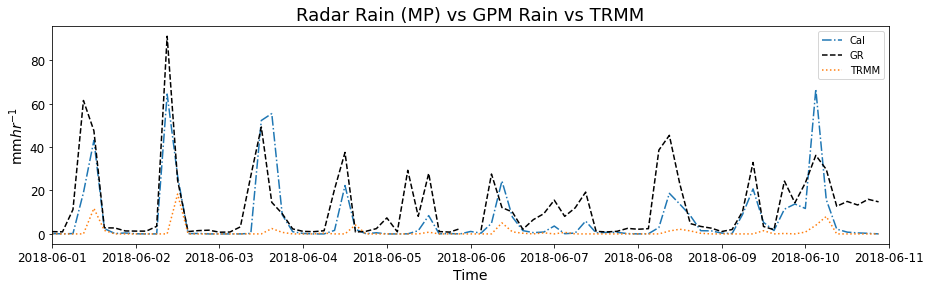

In [121]:
# plt.style.use('seaborn-white')
fig = plt.figure(figsize=[15,4])
plt.plot(time2,ds2['precipitationCal'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').sum(),'-.',label='Cal',)
plt.plot(time2,rain.sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').sum(),'k--',label='GR',)
# plt.plot(time2,ds2['HQprecipitation'].sel(time=slice('2018-06-01','2018-06-11')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').mean(),':',label='HQ',)
# plt.plot(time2,ds2['IRprecipitation'].sel(time=slice('2018-06-01','2018-06-11')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').mean(),':',label='IR',)
plt.plot(time2,ds_trmm['precipitation'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').sum(),':',label='TRMM',)

plt.ylabel('mm$hr^{-1}$',size=14)
plt.xlabel('Time',size=14)
plt.legend()
plt.title('Radar Rain (MP) vs GPM Rain vs TRMM',size=18)
plt.xlim(dt.datetime(2018,6,1),dt.datetime(2018,6,11))
plt.xticks(size=12)
plt.yticks(size=12)
# plt.grid()
plt.draw()

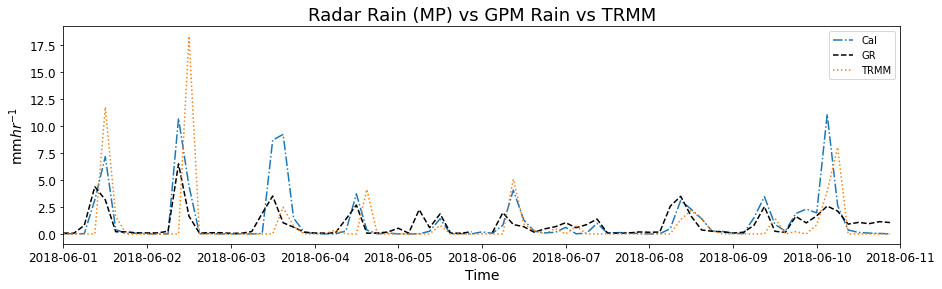

In [122]:
# plt.style.use('seaborn-white')
fig = plt.figure(figsize=[15,4])
plt.plot(time2,ds2['precipitationCal'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').mean(),'-.',label='Cal',)
plt.plot(time2,rain.sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').mean(),'k--',label='GR',)
# plt.plot(time2,ds2['HQprecipitation'].sel(time=slice('2018-06-01','2018-06-11')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').mean(),':',label='HQ',)
# plt.plot(time2,ds2['IRprecipitation'].sel(time=slice('2018-06-01','2018-06-11')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').mean(),':',label='IR',)
plt.plot(time2,ds_trmm['precipitation'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='3H').mean(),':',label='TRMM',)

plt.ylabel('mm$hr^{-1}$',size=14)
plt.xlabel('Time',size=14)
plt.legend()
plt.title('Radar Rain (MP) vs GPM Rain vs TRMM',size=18)
plt.xlim(dt.datetime(2018,6,1),dt.datetime(2018,6,11))
plt.xticks(size=12)
plt.yticks(size=12)
# plt.grid()
plt.draw()

In [123]:
era = xr.open_dataset('TRMM/adaptor.mars.internal-1629139576.3375762-28337-17-ce8dc1ac-1c8a-48f8-bbf8-284bdc7c323b.nc')

In [124]:
era

<xarray.Dataset>
Dimensions:    (longitude: 17, latitude: 21, time: 264)
Coordinates:
  * longitude  (longitude) float32 72.0 72.25 72.5 72.75 ... 75.5 75.75 76.0
  * latitude   (latitude) float32 21.0 20.75 20.5 20.25 ... 16.5 16.25 16.0
  * time       (time) datetime64[ns] 2018-06-01 ... 2018-06-11T23:00:00
Data variables:
    cp         (time, latitude, longitude) float32 ...
    crr        (time, latitude, longitude) float32 ...
    tcrw       (time, latitude, longitude) float32 ...
    tp         (time, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2021-08-16 18:46:18 GMT by grib_to_netcdf-2.20.0: /opt/ecmw...

In [125]:
era_rain = era['cp']

In [126]:
era_rain = era_rain*3600

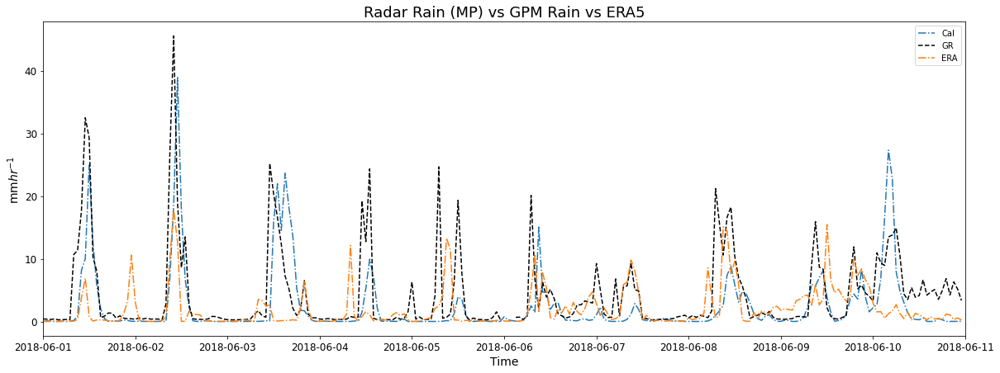

In [127]:
# plt.style.use('seaborn-white')
fig = plt.figure(figsize=[20,7])
plt.plot(xtime,ds2['precipitationCal'].sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='1H').sum(),'-.',label='Cal',)
plt.plot(xtime,rain.sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='1H').sum(),'k--',label='GR',)
# plt.plot(xtime,ds2['HQprecipitation'].sel(time=slice('2018-06-01','2018-06-11')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='1H').mean(),':',label='HQ',)
# plt.plot(xtime,ds2['IRprecipitation'].sel(time=slice('2018-06-01','2018-06-11')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='1H').mean(),':',label='IR',)
plt.plot(xtime,era_rain.sel(time=slice('2018-06-01','2018-06-10')).sel(longitude=slice(73.5,73.8),latitude=slice(18.0,17.6)).mean(dim=['longitude','latitude']).resample(time='1H').sum(),'-.',label='ERA',)
plt.ylabel('mm$hr^{-1}$',size=14)
plt.xlabel('Time',size=14)
plt.legend()
plt.title('Radar Rain (MP) vs GPM Rain vs ERA5',size=18)
plt.xlim(dt.datetime(2018,6,1),dt.datetime(2018,6,11))
plt.xticks(size=12)
plt.yticks(size=12)
# plt.grid()
plt.draw()

if ref.any() > 38:
    zl = wrl.trafo.idecibel(ds1['REF'][:,5])
    rainx = wrl.zr.z_to_r(zl,a = 154, b= 1.26)
if ref.any() < 38:
    zl = wrl.trafo.idecibel(ds1['REF'][:,5])
    rainx = wrl.zr.z_to_r(zl, a = 250, b = 1.2)

In [128]:
1/1.6

0.625

In [129]:
1/.79

1.2658227848101264

In [130]:
154, 1.26

(154, 1.26)

In [131]:
250, 1.2

(250, 1.2)

In [132]:
zl = wrl.trafo.idecibel(ref)

In [ ]:
# del mask
# del str_mask

In [133]:
mask = np.zeros(ref.shape)

In [134]:
mask[ref>=35]=1

In [135]:
str_mask = np.zeros_like(mask)

In [137]:
str_mask[ref<=34]=1

In [138]:
rainz = wrl.zr.z_to_r(zl,a = 180, b= 1.26)

In [139]:
rain_con = rainz*mask

In [140]:
rainst = wrl.zr.z_to_r(zl,a = 250, b= 1.2)

In [141]:
rainst = rainst*str_mask

In [142]:
rainst_ = rainst.sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='1H').mean()
raincon_ = rain_con.sel(time=slice('2018-06-01','2018-06-10')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='1H').mean()

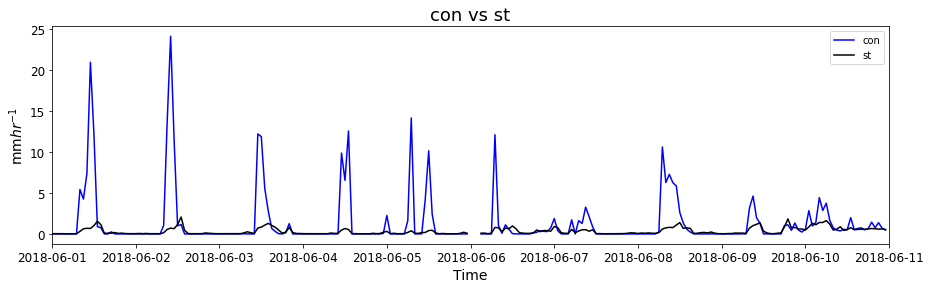

In [143]:
fig = plt.figure(figsize=[15,4])
plt.plot(xtime,raincon_,'b-',label='con',)
plt.plot(xtime,rainst_,'k-',label='st',)
plt.ylabel('mm$hr^{-1}$',size=14)
plt.xlabel('Time',size=14)
plt.legend()
plt.title('con vs st',size=18)
plt.xlim(dt.datetime(2018,6,1),dt.datetime(2018,6,11))
plt.xticks(size=12)
plt.yticks(size=12)
# plt.grid()
plt.draw()

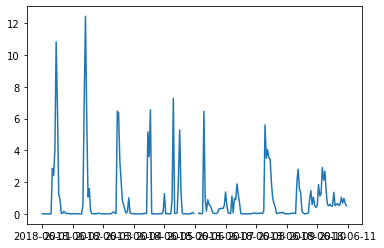

In [144]:
plt.plot(xtime,(rainst_+raincon_)/2)

In [145]:
zc = ref.where(ref>=35)
zs = ref.where(ref<35)

In [146]:
zlc = wrl.trafo.idecibel(zc)
zls = wrl.trafo.idecibel(zs)

In [147]:
zrcn = wrl.zr.z_to_r(zlc,a = 154, b = 1.26)
zrst = wrl.zr.z_to_r(zls,a = 250, b = 1.2)

In [148]:
zrcn1 = zrcn.fillna(0)
zrst1 = zrst.fillna(0)

In [149]:
comb = zrcn1+zrst1

In [151]:
zrcnbox = zrcn1.sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='1H').mean()
zrstbox = zrst1.sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='1H').mean()

In [152]:
xr.corr((zrcnbox+zrstbox),gpm1)

<xarray.DataArray ()>
array(0.54488546)
Coordinates:
    z        float64 2.564e+03

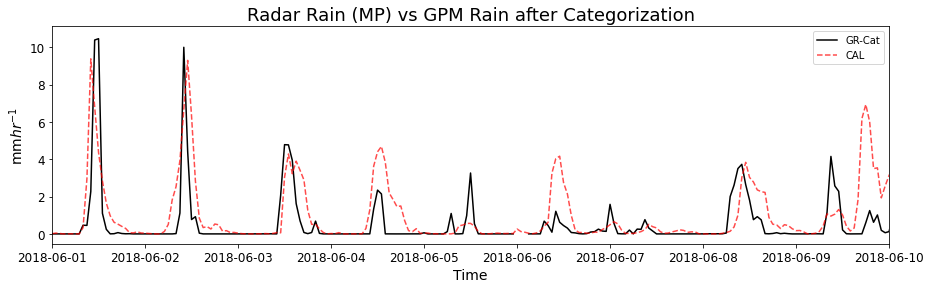

In [153]:
plt.figure(figsize=[15,4])
plt.plot(xtime,zrcnbox+zrstbox,'k-',label='GR-Cat')
# plt.plot(xtime,rain1,'k-',alpha=0.6,label='GR-MP')
plt.plot(xtime,gpm1,'r--',alpha=0.7,label='CAL')
# plt.plot(xtime,ds2['HQprecipitation'].sel(time=slice('2018-06-01','2018-06-11')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='1H').mean(),':',label='HQ',)
# plt.plot(xtime,ds2['IRprecipitation'].sel(time=slice('2018-06-01','2018-06-11')).sel(lon=slice(73.5,73.8),lat=slice(17.6,18.0)).mean(dim=['lon','lat']).resample(time='1H').mean(),':',label='IR',)
plt.ylabel('mm$hr^{-1}$',size=14)
plt.xlabel('Time',size=14)
plt.legend()
plt.title('Radar Rain vs GPM Rain after Categorization',size=18)
plt.xlim(dt.datetime(2018,6,1),dt.datetime(2018,6,10))
plt.xticks(size=12)
plt.yticks(size=12)
# plt.grid()
plt.draw()

In [154]:
pcalint = ds2.precipitationCal.sel(time=slice('2018-06-01','2018-06-10')).interp_like(comb)

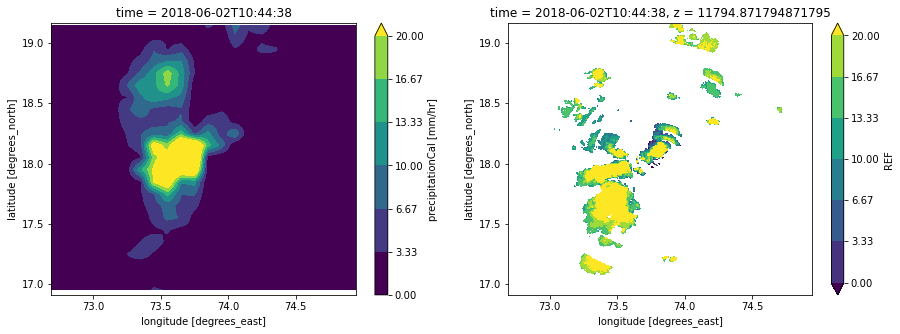

In [155]:
plt.figure(figsize=[15,5])
plt.subplot(121)
pcalint[165].T.plot.contourf(vmax=20)
plt.subplot(122)
ds1.REF[165,23].plot.contourf(vmin=0,vmax=20)

In [156]:
comb.values[comb.values<=0] = np.nan

In [157]:
def reorder_dims(darray, dim1, dim2):
    """
    Interchange two dimensions of a DataArray in a similar way as numpy's swap_axes
    """
    dims = list(darray.dims)
    assert set([dim1,dim2]).issubset(dims), 'dim1 and dim2 must be existing dimensions in darray'
    ind1, ind2 = dims.index(dim1), dims.index(dim2)
    dims[ind2], dims[ind1] = dims[ind1], dims[ind2]
    return darray.transpose(*dims)

In [158]:
reod = reorder_dims(pcalint,'lat','lon')

In [159]:
IR = reorder_dims(ds2.IRprecipitation,'lat','lon')

In [160]:
IR = IR.sel(time=slice('2018-06-01','2018-06-10')).interp_like(comb)

In [161]:
m_IR = np.ma.array(IR, mask=np.isnan(ref))

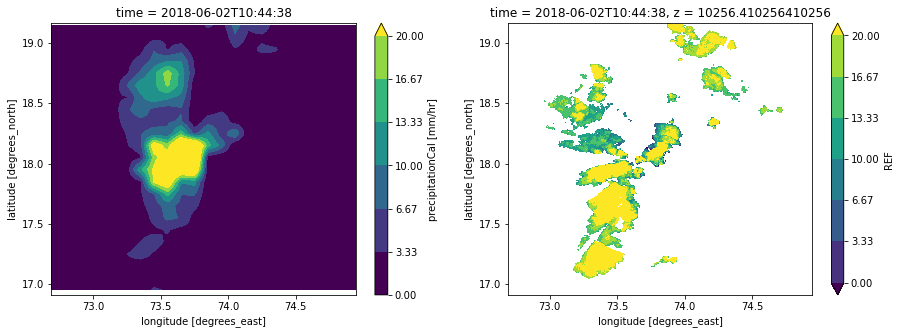

In [162]:
plt.figure(figsize=[15,5])
plt.subplot(121)
reod[165].plot.contourf(vmax=20)
plt.subplot(122)
ds1['REF'][165,20].plot.contourf(vmin=0,vmax=20)

In [163]:
m_reod = np.ma.array(reod, mask=np.isnan(ref))

In [164]:
w1 = xr.DataArray(data = m_reod, coords=comb.coords, dims=comb.dims)

In [165]:
w2 = xr.DataArray(data = m_IR, coords=comb.coords, dims=comb.dims)

In [166]:
comb.values[comb.values>=1000] = np.nan

Text(0.5, 1.0, 'Whole Area Under Radar Domain')

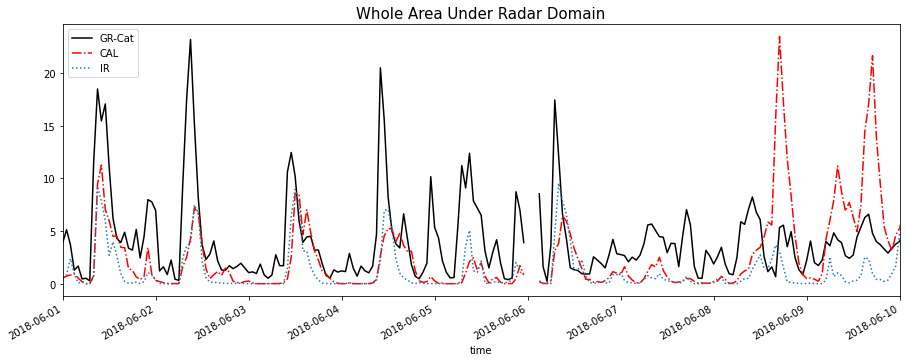

In [167]:
plt.figure(figsize=[15,5])
comb.mean(dim=['lat','lon']).resample(time='1H').mean().plot.line('k-',label='GR-Cat')
w1.mean(dim=['lat','lon']).resample(time='1H').mean().plot.line('r-.',label='CAL')
w2.mean(dim=['lat','lon']).resample(time='1H').mean().plot.line(':',label='IR')
plt.xlim(dt.datetime(2018,6,1),dt.datetime(2018,6,10))
plt.legend()
plt.title('Whole Area Under Radar Domain',size=15)

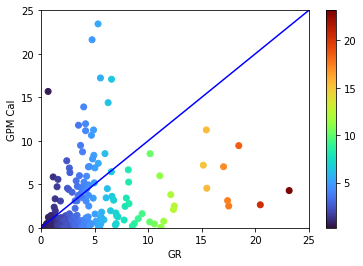

In [168]:
plt.plot([-1,25],[-1,25],'b-')
plt.scatter(comb.mean(dim=['lat','lon']).resample(time='1H').mean(),w1.mean(dim=['lat','lon']).resample(time='1H').mean(),c=comb.mean(dim=['lat','lon']).resample(time='1H').mean(),cmap='turbo')
plt.colorbar()
plt.xlim(0,25)
plt.ylim(0,25)
plt.xlabel('GR')
plt.ylabel('GPM Cal')
plt.show()

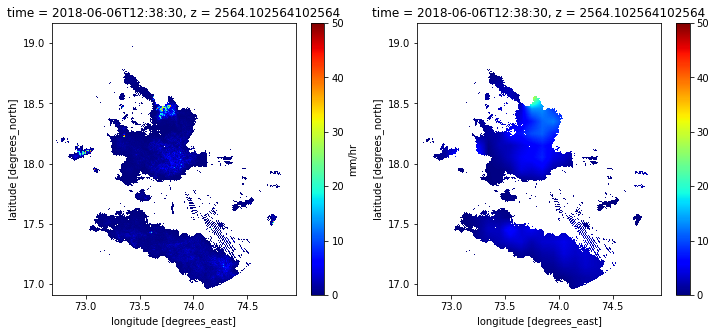

In [169]:
fig = plt.figure(figsize=[12,5])
plt.subplot(121)
plot1 = comb[612].plot(cmap='jet',vmin=0,vmax=50,add_colorbar=False)
plt.colorbar(plot1,label='mm/hr')
plt.subplot(122)
w1[612].plot(cmap='jet',vmin=0,vmax=50,)
plt.show()

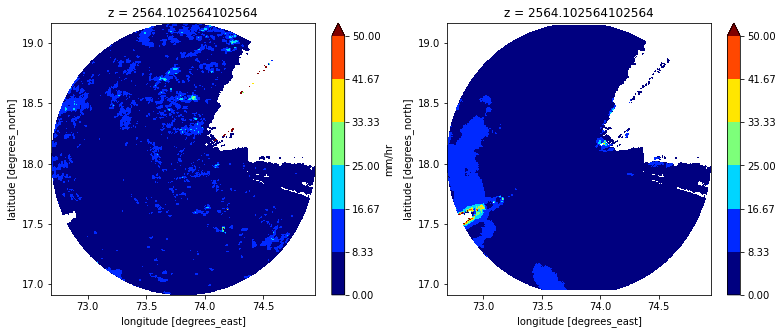

In [170]:
fig = plt.figure(figsize=[13,5])
plt.subplot(121)
plot1 = comb.mean(dim='time').plot.contourf(cmap='jet',vmin=0,vmax=50,add_colorbar=False)
plt.colorbar(plot1,label='mm/hr')
plt.subplot(122)
w1.mean(dim='time').plot.contourf(cmap='jet',vmin=0,vmax=50,)
plt.show()

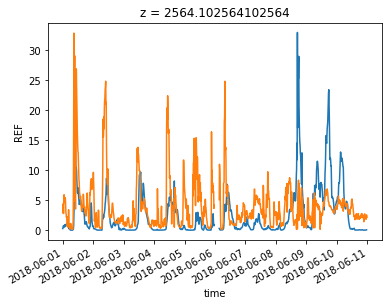

In [171]:
w1.mean(dim=['lon','lat']).plot()
comb.mean(dim=['lon','lat']).plot()

In [172]:
new_scgr = xr.Dataset(
    {"Radar_Rain": (('time'), comb.mean(dim=['lon','lat']).values),
    "GPM_Cal_Rain": (('time'),w1.mean(dim=['lat','lon']).values)},
    coords={
        "time":comb.time,

    },
)
new_scgr

<xarray.Dataset>
Dimensions:       (time: 1115)
Coordinates:
    z             float64 2.564e+03
  * time          (time) datetime64[ns] 2018-06-01T00:04:13 ... 2018-06-10T23...
Data variables:
    Radar_Rain    (time) float64 2.931 4.377 3.881 2.782 ... 2.545 2.207 2.166
    GPM_Cal_Rain  (time) float64 0.2608 0.3407 0.7012 0.6845 ... 0.05051 nan nan

In [173]:
new_scgr.hvplot.area()

:NdOverlay   [Variable]
   :Area   [time]   (value,Baseline)

In [174]:
new_scgr.hvplot.kde()

:NdOverlay   [Variable]
   :Distribution   [value]   (Density)

In [175]:
new_scgr.hvplot.line(color=['k','g'])

:NdOverlay   [Variable]
   :Curve   [time]   (value)

In [176]:
import seaborn as sns

<AxesSubplot:xlabel='Radar_Rain', ylabel='GPM_Cal_Rain'>

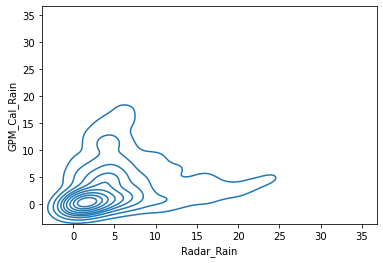

In [177]:
sns.kdeplot(new_scgr['Radar_Rain'],new_scgr['GPM_Cal_Rain'])

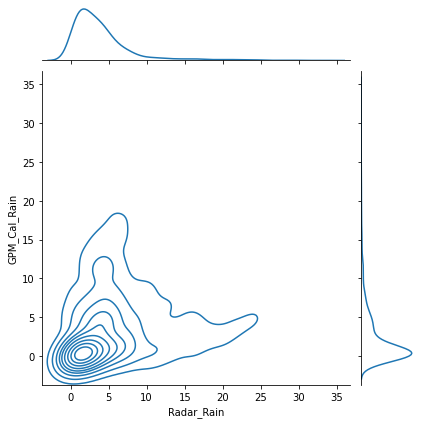

In [178]:
sns.jointplot(new_scgr['Radar_Rain'],new_scgr['GPM_Cal_Rain'], kind='kde');

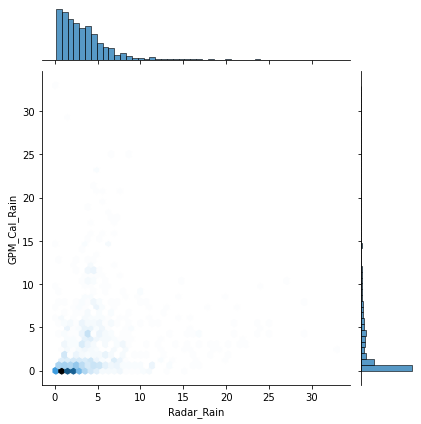

In [179]:
sns.jointplot(new_scgr['Radar_Rain'],new_scgr['GPM_Cal_Rain'], kind='hex')

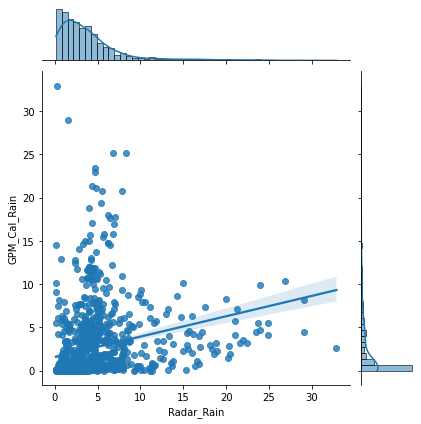

In [180]:
sns.jointplot(new_scgr['Radar_Rain'],new_scgr['GPM_Cal_Rain'], kind='reg',)

In [181]:
zmean = ds1['REF'].sel(time='2018-06-01').mean(dim='z')#.plot(cmap='jet',vmin=0)

In [182]:
zc11 = zmean.where(zmean>=35)
zs11 = zmean.where(zmean<35)
zmcc = wrl.trafo.idecibel(zc11)
zmss = wrl.trafo.idecibel(zs11)
zrc11 = wrl.zr.z_to_r(zmcc,a = 154, b = 1.26)
zrs11 = wrl.zr.z_to_r(zmss,a = 250, b = 1.2)

In [183]:
zrc12 = zrc11.fillna(0)+zrs11.fillna(0)

In [184]:
zrc12.values[zrc12.values<0] = np.nan

In [185]:
zrc12.values[zrc12.values==0] = np.nan

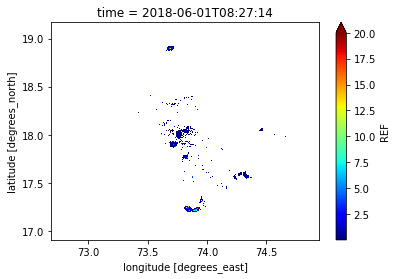

In [186]:
zrc12[40].plot(cmap='jet',vmax=20)

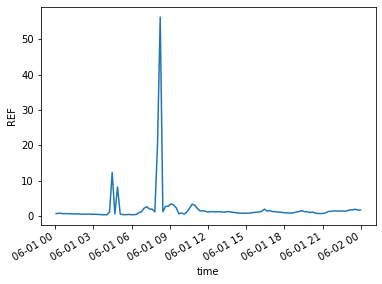

In [187]:
zrc12.mean(dim=['lat','lon']).plot.line()

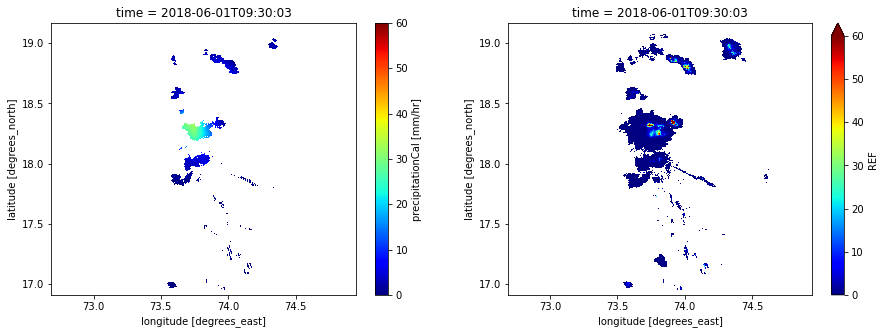

In [188]:
i=45
plt.figure(figsize=[15,5])
plt.subplot(121)
pcalint[i].T.plot(cmap='jet',vmax=60)
plt.subplot(122)
zrc12[i].plot(cmap='jet',vmin=0,vmax=60)

In [189]:
era_rl = pd.read_csv('z/surface-land_sub-daily_2018-06-01_2018-06-11_subset_csv-obs_61416725_v1.csv')

In [190]:
era_rl

,observation_id,data_policy_licence,date_time,date_time_meaning,observation_duration,longitude,latitude,report_type,height_above_surface,observed_variable,units,observation_value,value_significance,platform_type,station_type,primary_station_id,station_name,quality_flag,source_id,date
0,INM00043113-2-2018-06-07-03:00-107-12,WMO essential,2018-06-07 03:00:00+00:00,beginning,instantaneous,74.05,17.52,SYNOP,10.0,wind_speed,m/s,0.00,Instantaneous value of observed parameter,NaN,Land station,INM00043113,SATARA,Passed,220,2018-06-07
1,INM00043001-4-2018-06-01-00:00-85-12,WMO essential,2018-06-01 00:00:00+00:00,beginning,instantaneous,72.72,19.97,SYNOP,2.0,air_temperature,K,302.35,Instantaneous value of observed parameter,NaN,Land station,INM00043001,DAHANU,Passed,220,2018-06-01
2,INM00043001-4-2018-06-01-00:00-36-12,WMO essential,2018-06-01 00:00:00+00:00,beginning,instantaneous,72.72,19.97,SYNOP,2.0,dew_point_temperature,K,299.55,Instantaneous value of observed parameter,NaN,Land station,INM00043001,DAHANU,Passed,220,2018-06-01
3,INM00043001-4-2018-06-01-00:00-58-12,WMO essential,2018-06-01 00:00:00+00:00,beginning,instantaneous,72.72,19.97,SYNOP,2.0,air_pressure_at_sea_level,Pa,100460.00,Instantaneous value of observed parameter,NaN,Land station,INM00043001,DAHANU,Passed,220,2018-06-01
4,INI0000VAJJ-1-2018-06-01-02:30-107-12,WMO essential,2018-06-01 02:30:00+00:00,beginning,instantaneous,72.83,19.12,SYNOP,10.0,wind_speed,m/s,2.60,Instantaneous value of observed parameter,NaN,Land station,INI0000VAJJ,BOMBAY / JUHU,Passed,223,2018-06-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2537,INM00042921-6-2018-06-11-18:00-106-12,WMO essential,2018-06-11 18:00:00+00:00,beginning,instantaneous,73.82,19.97,SYNOP,10.0,wind_from_direction,deg,250.00,Instantaneous value of observed parameter,NaN,Land station,INM00042921,NASIK CITY,Passed,220,2018-06-11
2538,INM00042921-6-2018-06-11-18:00-85-12,WMO essential,2018-06-11 18:00:00+00:00,beginning,instantaneous,73.82,19.97,SYNOP,2.0,air_temperature,K,300.65,Instantaneous value of observed parameter,NaN,Land station,INM00042921,NASIK CITY,Passed,220,2018-06-11
2539,INM00042921-6-2018-06-11-21:00-36-12,WMO essential,2018-06-11 21:00:00+00:00,beginning,instantaneous,73.82,19.97,SYNOP,2.0,dew_point_temperature,K,295.05,Instantaneous value of observed parameter,NaN,Land station,INM00042921,NASIK CITY,Passed,220,2018-06-11
2540,INM00042921-6-2018-06-11-21:00-85-12,WMO essential,2018-06-11 21:00:00+00:00,beginning,instantaneous,73.82,19.97,SYNOP,2.0,air_temperature,K,299.35,Instantaneous value of observed parameter,NaN,Land station,INM00042921,NASIK CITY,Passed,220,2018-06-11


In [191]:
era_rl[['date_time','longitude','latitude','height_above_surface','observed_variable']]

,date_time,longitude,latitude,height_above_surface,observed_variable
0,2018-06-07 03:00:00+00:00,74.05,17.52,10.0,wind_speed
1,2018-06-01 00:00:00+00:00,72.72,19.97,2.0,air_temperature
2,2018-06-01 00:00:00+00:00,72.72,19.97,2.0,dew_point_temperature
3,2018-06-01 00:00:00+00:00,72.72,19.97,2.0,air_pressure_at_sea_level
4,2018-06-01 02:30:00+00:00,72.83,19.12,10.0,wind_speed
...,...,...,...,...,...
2537,2018-06-11 18:00:00+00:00,73.82,19.97,10.0,wind_from_direction
2538,2018-06-11 18:00:00+00:00,73.82,19.97,2.0,air_temperature
2539,2018-06-11 21:00:00+00:00,73.82,19.97,2.0,dew_point_temperature
2540,2018-06-11 21:00:00+00:00,73.82,19.97,2.0,air_temperature
